# View Exposures of Raws


- work with Weakly_2022_39
- use jupyter kernel LSST : **lsst_distrib_2022_39**



- author : Sylvie Dagoret-Campagne
- affiliation : IJCLab
- creation date : 2022/12/08
- last update : 2022/12/08



In [1]:
! eups list -s | grep LOCAL

atmospec              LOCAL:/home/d/dagoret/repos/repos_w_2022_39/atmospec 	setup
drp_pipe              LOCAL:/home/d/dagoret/repos/repos_w_2022_39/drp_pipe 	setup
eups                  LOCAL:/opt/lsst/software/stack/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-4.1.0/eups 	setup
summit_utils          LOCAL:/home/d/dagoret/repos/repos_w_2022_39/summit_utils 	setup


In [2]:
! echo $IMAGE_DESCRIPTION
! eups list -s lsst_distrib

w_2022_39
   g0b29ad24fb+a10408d0bf 	current w_2022_39 setup


In [3]:
import os
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cmx
import matplotlib.dates as mdates

import numpy as np
import pandas as pd
%matplotlib inline
from matplotlib.colors import LogNorm

from mpl_toolkits.axes_grid1 import make_axes_locatable

import matplotlib.ticker                         # here's where the formatter is
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)

from astropy.visualization import (MinMaxInterval, SqrtStretch,ZScaleInterval,PercentileInterval,
                                   ImageNormalize,imshow_norm)
from astropy.visualization.stretch import SinhStretch, LinearStretch,AsinhStretch,LogStretch


from astropy.io import fits




In [4]:
# LSST Display
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend('matplotlib')

In [5]:
import lsst.daf.butler as dafButler

# Configuration

In [6]:
DATE = 20221207
FILTER="empty-holo4_003"
filename_visits = f"visitdispersers_{DATE}_filt_{FILTER}.list"

In [7]:
df = pd.read_csv(filename_visits, header=None,skiprows = 1, sep=' ',names=["date","seq"])
df

,date,seq
0,20221207,357
1,20221207,361
2,20221207,362
3,20221207,366
4,20221207,367
5,20221207,371
6,20221207,372
7,20221207,376
8,20221207,377
9,20221207,381


In [8]:
for index,row in df.iterrows():
    exposure_selected =row["date"]*100000+row["seq"]
    print(exposure_selected)

2022120700357
2022120700361
2022120700362
2022120700366
2022120700367
2022120700371
2022120700372
2022120700376
2022120700377
2022120700381
2022120700382
2022120700386
2022120700387
2022120700391
2022120700392
2022120700396
2022120700397
2022120700401
2022120700402
2022120700406
2022120700407
2022120700411
2022120700412
2022120700416
2022120700417
2022120700421
2022120700422
2022120700426
2022120700427
2022120700431
2022120700432
2022120700436
2022120700437
2022120700442
2022120700443
2022120700447
2022120700448
2022120700453
2022120700454
2022120700458
2022120700459
2022120700463
2022120700464


## Select flags options

In [9]:
FLAG_ROTATE_IMG = True
FLAG_TRANSFORM = True

## Transformations
astropy scale transformations

In [10]:
transform = AsinhStretch() + PercentileInterval(99.)
#transform = PercentileInterval(98.)

## Butler

In [11]:
#repo = '/sdf/group/rubin/repo/main'
repo="/sdf/group/rubin/repo/oga/"
butler = dafButler.Butler(repo)
registry = butler.registry

In [12]:
collection='LATISS/raw/all'

In [13]:
exposure_selected = 2022031700272

/tmp/tmpy3n96zng.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))
/tmp/tmp1p6po8xr.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))
/tmp/tmpgxyswsdx.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))
/tmp/tmprl42hsdc.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))
/tmp/tmpw7a2eotg.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))
/tmp/tmp38sji3v3.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))
/tmp/tmpq6g0sq6z.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=

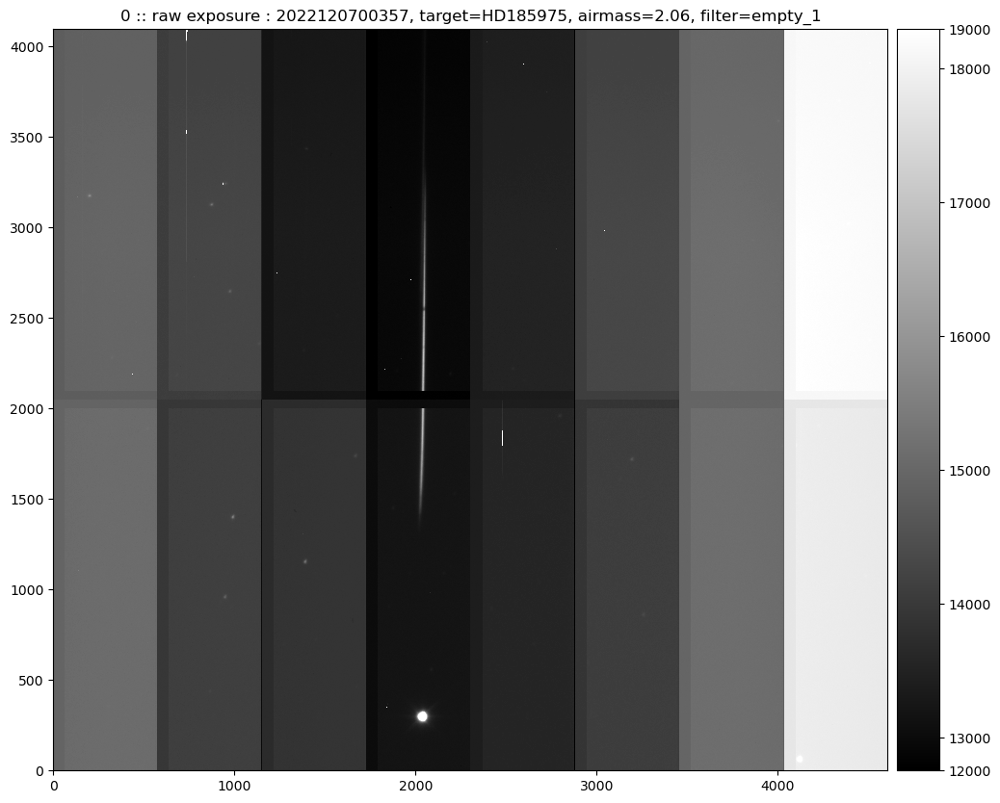

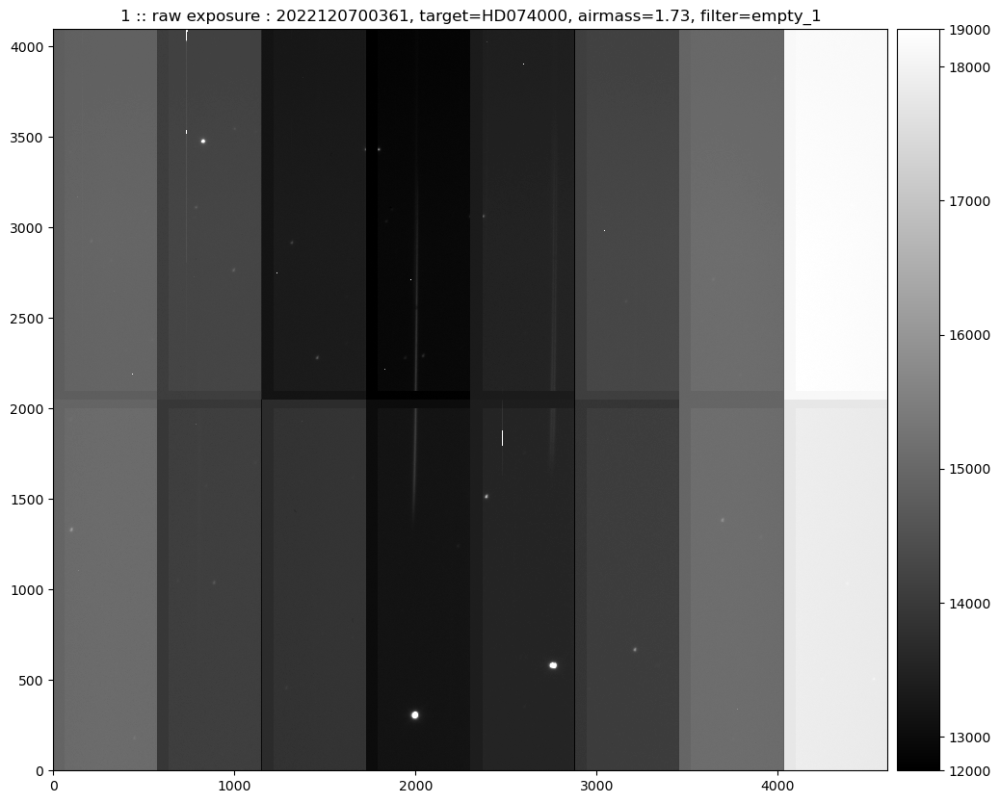

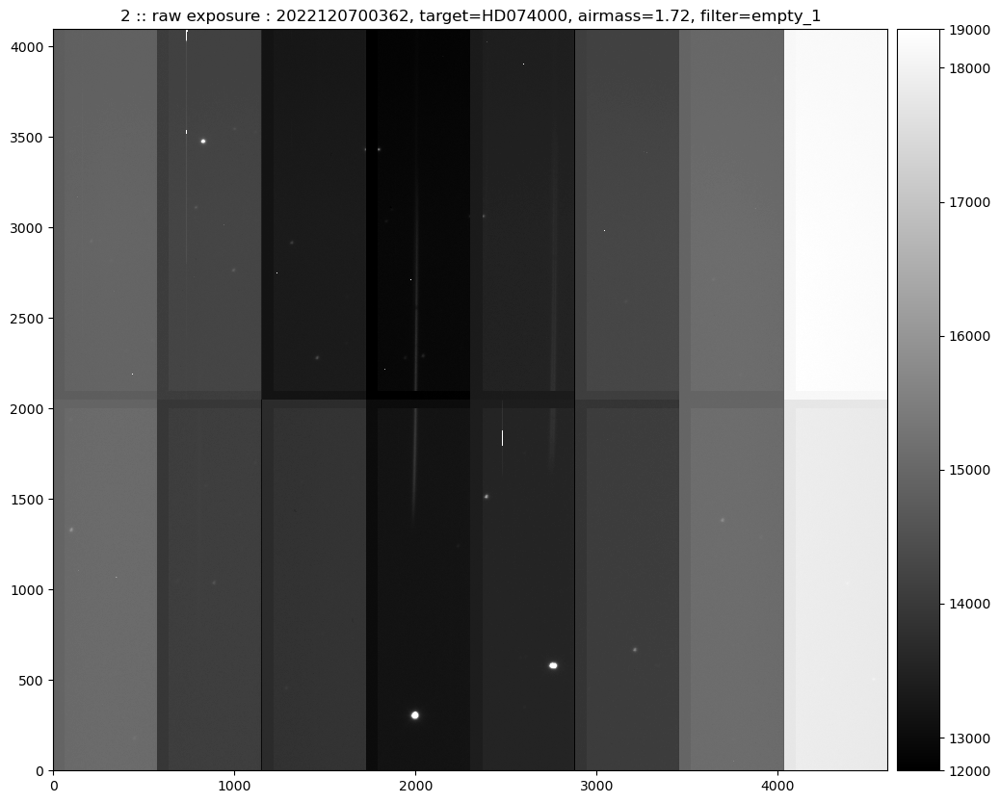

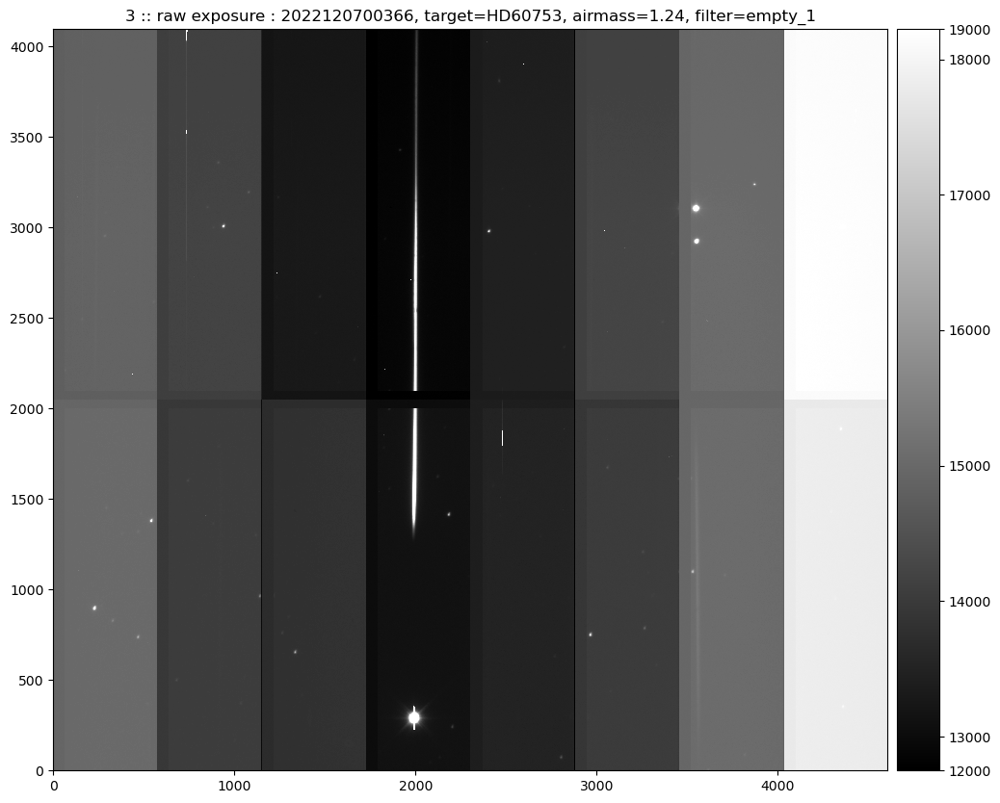

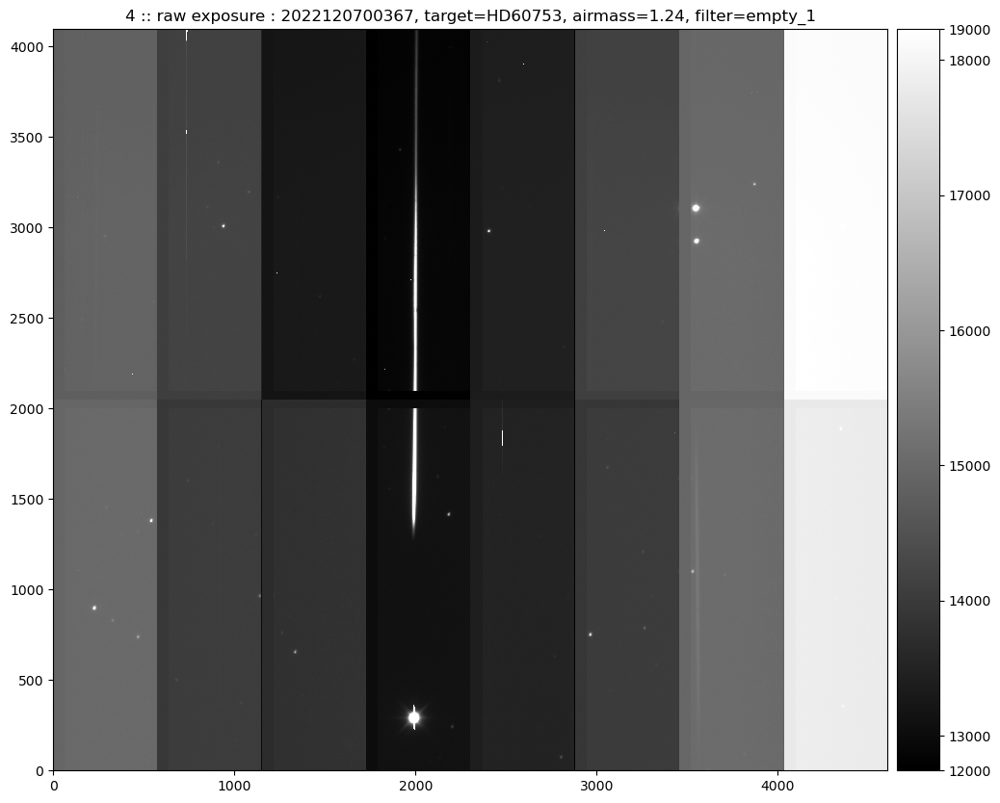

...

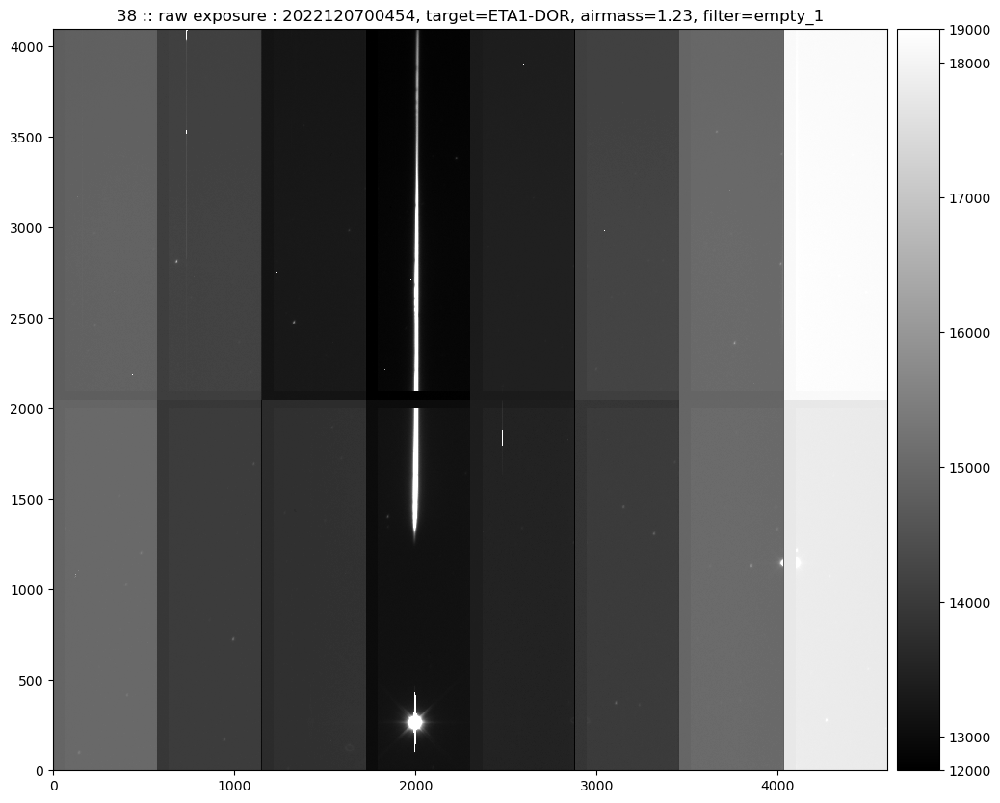

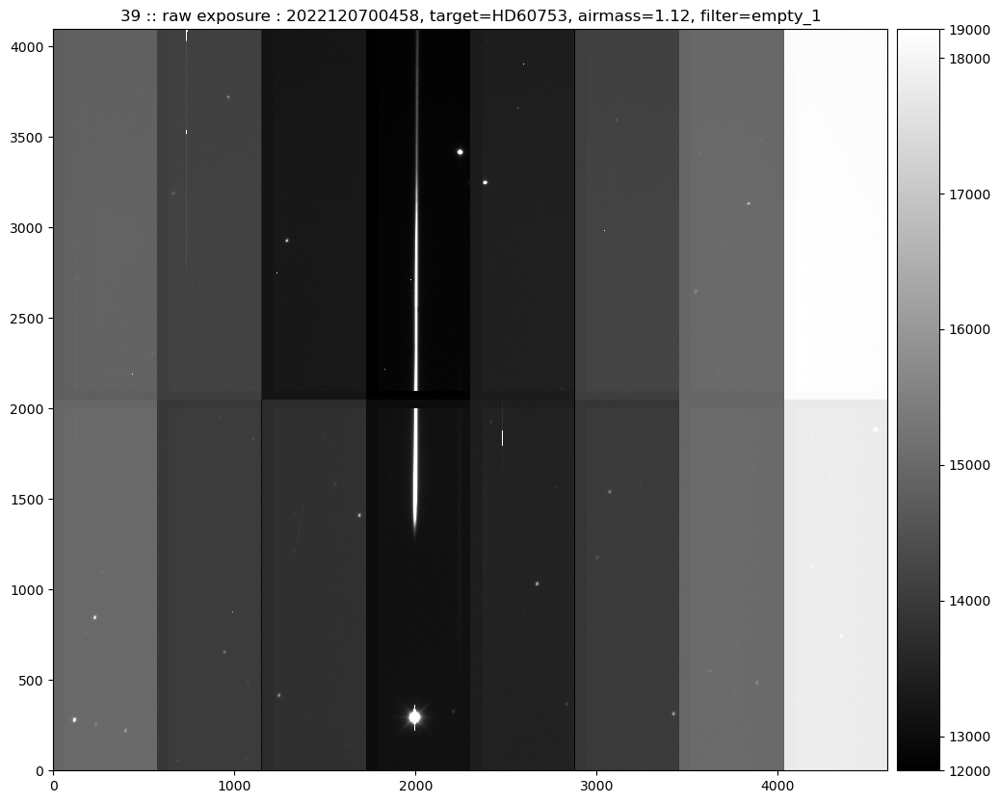

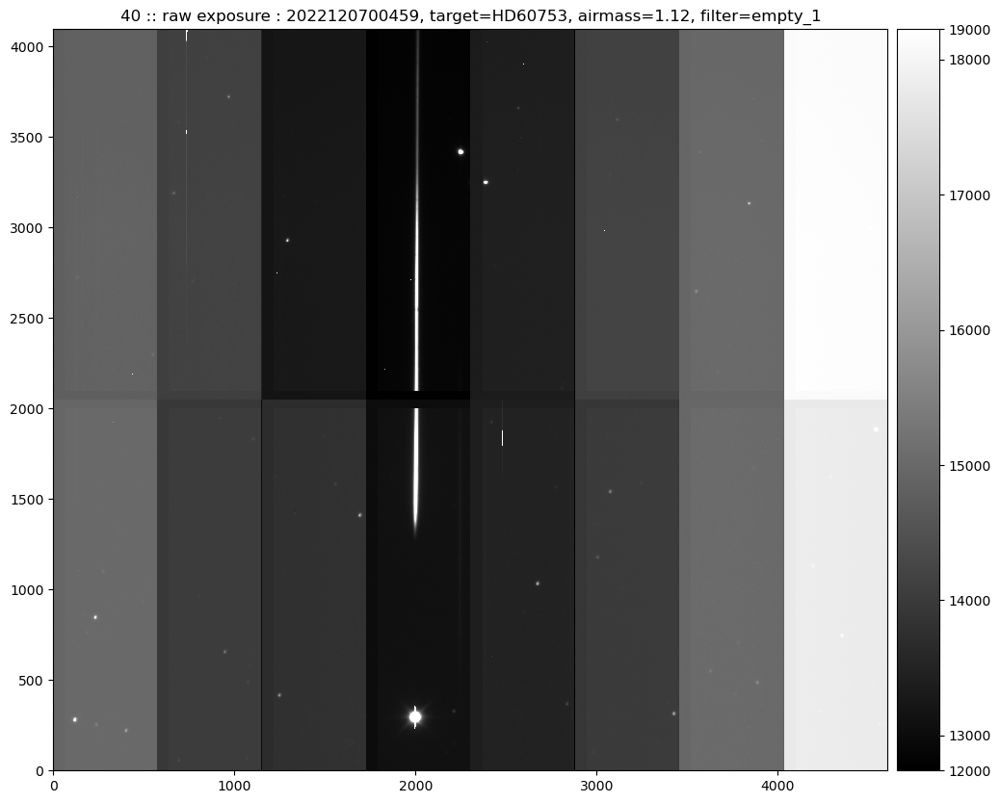

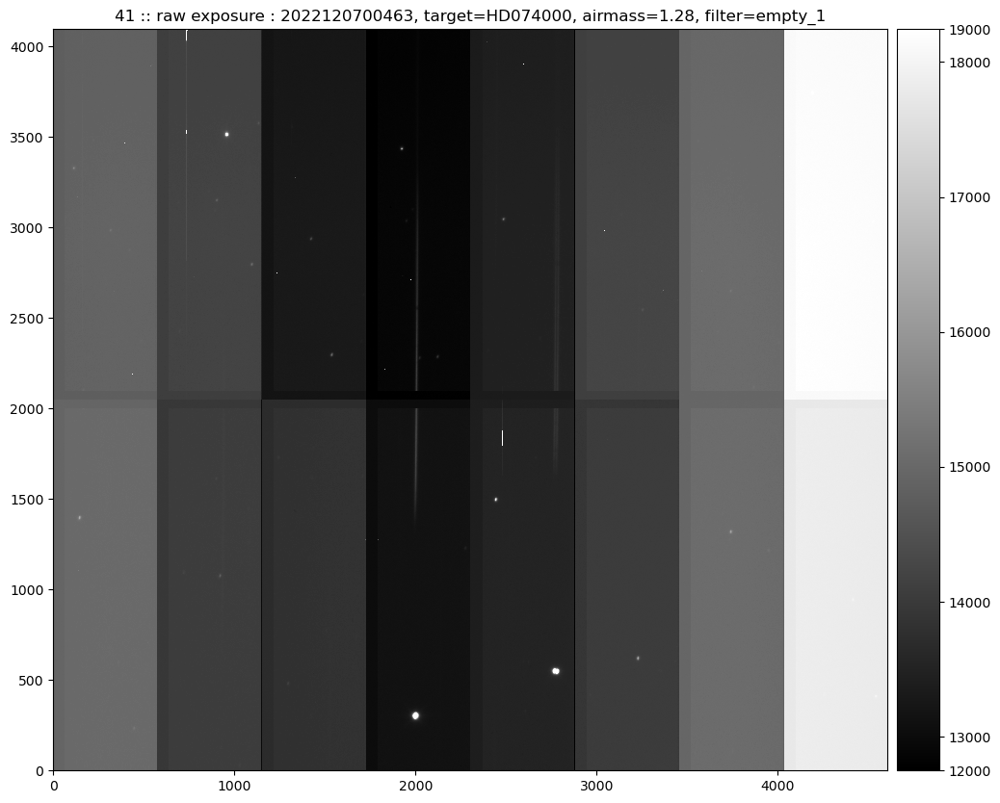

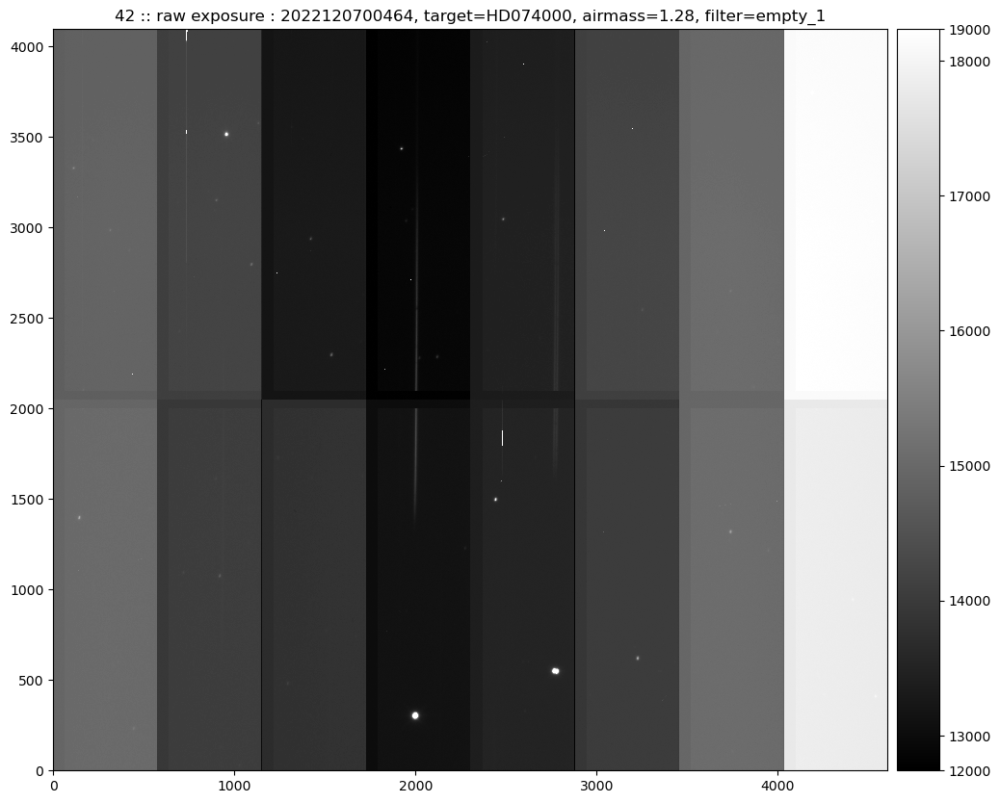

In [14]:
for index,row in df.iterrows():
    exposure_selected =row["date"]*100000+row["seq"]



    raw_img= butler.get('raw', dataId={'exposure': exposure_selected, 'instrument': 'LATISS', 'detector': 0}, collections = collection)
    meta = raw_img.getMetadata()
    md = meta.toDict()
    
    the_object = md['OBJECT']
    the_am= md['AMSTART']
    the_filter=md['FILTER']
    
    fig = plt.figure(figsize=(12,10))
    afw_display = afwDisplay.Display(frame=fig)
    afw_display.scale('linear', 'zscale',None)
    the_title = f"{index} :: raw exposure : {exposure_selected}, target={the_object}, airmass={the_am:.2f}, filter={the_filter}"
    afw_display.mtv(raw_img.image,title=the_title)

In [15]:
# Save in files

In [ ]:
for index,row in df.iterrows():
    
    exposure_selected =row["date"]*100000+row["seq"]



    raw_img= butler.get('raw', dataId={'exposure': exposure_selected, 'instrument': 'LATISS', 'detector': 0}, collections = collection)
    meta = raw_img.getMetadata()
    md = meta.toDict()

    the_object = md['OBJECT']
    the_am= md['AMSTART']
    the_filter=md['FILTER']

    filename_out = f"raw_img_{exposure_selected}_{the_object}.fits"
    print(filename_out)
    
    hdr = fits.Header()
    
    for key,value in md.items():
        hdr[str(key)]=value
        
    hdu = fits.PrimaryHDU(data=raw_img.image.array,header=hdr)  # with headers
    #hdu = fits.PrimaryHDU(data=all_my_raw_array[idx])
    
    hdul = fits.HDUList([hdu])
    
    hdul.writeto(filename_out,overwrite=True)
    





/tmp/tmpk9pnlphq.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmp5ueujy4v.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmpymp3a38x.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmpm9fagzb3.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmpwcukbkhg.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmpf9n0r24n.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmp2w25gdk4.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmptywq2lq1.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmpdsyyp2i4.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmpuj5g4hvo.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmpslnpn8xa.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmp56u72vja.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmpflqtpnlt.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmpv0a3v6ek.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmpc4st35cq.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmpos0m1mr2.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmp_cnn4q9x.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmpdlr0uktu.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmp5khfw65j.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmp34wpg8n4.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmpdln_po7f.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmpoajquzyi.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmp_uxsvuw6.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmp5e3r10ay.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmp1ty_6lrn.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmpu16bq7qy.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmpylmec512.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmptsnmj3_s.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmpw_7i1too.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmpl5pzq386.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


raw_img_{exposure_selected}_{the_object}.fits


/tmp/tmp4w_ooru2.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


In [20]:
raw_img.image.array

array([[14923., 14931., 14914., ..., 17568., 17115., 14911.],
       [14918., 14924., 14927., ..., 17573., 17113., 14907.],
       [14921., 14942., 14920., ..., 17570., 17120., 14911.],
       ...,
       [14777., 14797., 14774., ..., 17948., 17642., 15025.],
       [14779., 14787., 14781., ..., 17944., 17649., 15022.],
       [14784., 14789., 14771., ..., 17942., 17640., 15021.]],
      dtype=float32)